# The XY model in 2D

In lesson 06.03 we have simulated the Ising model in 2D using the Metropolis-Hastings algorithm. At each lattice site, we had a spin which could have values +1 or -1.

In this assignment, the goal is simulate a different system: the XY model

#### Lattice

We use again a two-dimensional, square lattice, that we will call $\Lambda$, with *periodic* boundary conditions. Define $L$ as the side of the square; then the lattice $\Lambda$ contains $N = L^2$ nodes.

#### Node

On each node of the lattice $\Lambda$, we place a single, unit vector $\mathbf{s}_i$ which can have any orientation in the plane: that is, at site $i$, we have

\begin{equation}
\mathbf{s}_i = \left(\cos\theta_i, \sin\theta_i\right) = (x_i, y_i)
\end{equation}

where $\theta \in [0, 2\pi)$, or alternatively $x_i^2 + y_i^2 = 1$

#### Configuration

A spin configuration $\mathbf{S}$ of the model is simply a set of spins $\mathbf{s}_j$ on the lattice $\Lambda$, that is $\mathbf{S} = \left\{\mathbf{s}_j\ \mathrm{for}\ j\in\Lambda\right\}$.

#### Energy

The energy of a configuration, in presence of an external magnetic field $H$, is simply given by

\begin{equation}
E = - J \sum_{\langle i, j\rangle} \mathbf{s}_i\cdot\mathbf{s}_j - H\sum_i x_i
\end{equation}

which can be rewritten in terms just of the angles $\theta_i$ as

\begin{equation}
E = - J \sum_{\langle i, j\rangle} \cos\left(\theta_i - \theta_j\right) - H\sum_i \cos\theta_i\ .
\end{equation}

The sum over $\langle i, j\rangle$ is meant to run over the nearest neighbours only, as we did for the Ising 2D model. In the following, we can assume $J=1$.

#### Distribution

As for the Ising model, we assume that the probability of a configuration $\mathbf{S}$ is given by

\begin{equation}
P(\mathbf{S}|\beta) = {\cal N} e^{-\beta E}
\end{equation}

with ${\cal N}$ an appropriate normalization, which is irrelevant in the following, and $\beta = \frac{1}{T}$ (we set $\kappa_B = 1$ for simplicity).

#### Interesting quantities

You can define several interesting quantities:

**Specific heat $C_V$**

The specific heat (per site) is defined as

\begin{equation}
C_V = \frac{1}{N\times T^2} \left(\langle E^2\rangle -   \langle E\rangle^2\right)
\end{equation}

where $E$ is the total energy, $N$ is the number of sites on the lattice, and the average $\langle\ldots\rangle$ is taken over several realizations, at fixed temperature $T$

**Magnetization per site**

The total magnetization is simply

\begin{equation}
\mathbf{M} = \sum_{i\in \Lambda} \mathbf{s}_i = \sum_{i\in \Lambda} \left(\cos\theta_i, \sin\theta_i\right)
\end{equation}

To visualize it, is better to take the absolute value

\begin{equation}
M = \left|\mathbf{M}\right| = \sqrt{M_x^2 + M_y^2}
\end{equation}

and the magnetization per site is simply

\begin{equation}
m = \frac{M}{N}
\end{equation}

**Magnetic susceptibility per site**

As for the specific heat, we define the magnetic susceptibility per site as

\begin{equation}
\chi_m = \frac{1}{N\times T}\left(\langle M^2\rangle - \langle M\rangle^2\right)
\end{equation}

where $M$ is the absolute value of the total magnetization.

## Assignment

1. Code the XY model using the angles $\theta_i$ as variables on the lattice $\Lambda$.
2. Use the Metropolis-Hastings algorithm to update the configurations: consider the example provided in 06.03 as a suggestion about coding efficiently the update step.
3. Set up a visualization routine: since we are dealing with a vector quantity, it is useful to exploit the same visualization technique that we have used in lesson 08.02, using the `quiver` function in the `matplotlib`
4. Try running the simulation with different values of temperature: for instance $T=0.1$, $T=1, T=2$ and visually compare, after a proper thermalization period, the configurations.
5. Set up a simulation, keeping the temperature $T$ fixed. Allow a proper thermalization period, then a proper measurement period. During the measurement period, you can choose to take measurement only every few updates (say, every 10 updates).
6. During each simulation measure the quantities $C_V, m, \chi_m$ defined above.
6. Perform several simulations, exploring the interval of temperatures $[0, 2]$, and build plots of $C_V, m, \chi_m$ as defined above.

## For better grades

A very interesting characteristic of the XY model is that they develop *vortices*; these are stable configurations in which there is a non-zero vorticity, which means that walking along a circle around the center of the vortex, one find that the spin is in average parallel or antiparallel to the circle.

Another peculiar configuration is the *anti-vortex* in which the spin is converging along one direction and diverging along another direction.

Examples of both features can be seen in the following image:

![Image](vertex.gif)
#### Vortices (at red dots) and anti-vortices (at green dot)

Examples of vortex formations can be seen in this YouTube video: https://www.youtube.com/watch?v=AC-KbtNCIfw

An additional assignment is to develop code for identifying and highlighting (for instance with a background color) the presence of a vortex or an anti-vortex.

## References

More information about the XY model is available in Wikipedia: https://en.wikipedia.org/wiki/Classical_XY_model


In [4]:
# We will try to code the XY model in a class:
import numpy
import numpy.random
%matplotlib inline
from matplotlib import animation, pyplot
from matplotlib import cm
import sys
import math
from IPython.display import HTML

class XYModel:
    #Assignment 1
    def __init__(self, **kwargs):
        """XY model

        Optional parameters
        -------------------
        L   : int
            side of the square relattice
        J   : float
            coupling (default 1)
        muB : float
            mag coupling (default 0.67)
        T   : float
            temperature (default 1.0)
        H   : float
            magfield (default 0.0)
        """
        self.L = int(kwargs.get('L',100))
        self.N = self.L * self.L
        self.J = float(kwargs.get('J',1.0))
        self.muB = float(kwargs.get('muB',0.67))
        self.T = float(kwargs.get('T', 1.0))
        self.H = float(kwargs.get('H', 0.0))
        self.age = 0
        self.S = numpy.zeros(shape= (self.L, self.L))
        #S is the value of each theta per node, no need to save cosine or sine since theta is the same

    def __str__(self):
        return r'XY {} x {}: J={}, muB={} T={}, H={}, age={}'.format(\
            self.L, self.L, self.J, self.muB, self.T, self.H,self.age)

    def randomize(self):
        #Mind you, this could be changed to use random values instead of a gaussian (it's centered in 0), though it's not too important
        self.S = numpy.random.rand(self.L, self.L)
        self.S = numpy.mod(self.S, 2 * numpy.pi)

    def assign(self, **kwargs):
        """Sets the value of all the spins

        Optional parameters
        -------------------
        value   : float
            value is [0, 2pi), all spins are assigned to that, default is 0
        """
        value  = kwargs.get('value', 0)
        self.S[:,:] = float(value % (2 * numpy.pi))

    def energy(self):
        """Average energy per site"""
        E = numpy.zeros( (self.L, self.L), float)
        E = - self.J * numpy.sum(numpy.cos(self.S - numpy.roll(self.S,1,1)) + numpy.cos(self.S - numpy.roll(self.S,1,0))) -\
            self.muB * self.H * numpy.sum(numpy.cos(self.S))
        return E

    def magnetization(self):
        mag_x, mag_y = numpy.sum(numpy.cos(self.S)), numpy.sum(numpy.sin(self.S))
        return math.sqrt(mag_x**2 + mag_y**2)

    def deltaEnergy(self, new_angles):
        """Energy jump at each site"""
        dE  = - self.J * (numpy.cos(new_angles - numpy.roll(self.S, 1,0)) - numpy.cos(self.S - numpy.roll(self.S, 1,0)))
        dE += - self.J * (numpy.cos(new_angles - numpy.roll(self.S, 1,1)) - numpy.cos(self.S - numpy.roll(self.S, 1,1)))
        dE += - self.J * (numpy.cos(new_angles - numpy.roll(self.S, -1,0)) - numpy.cos(self.S - numpy.roll(self.S, -1,0)))
        dE += - self.J * (numpy.cos(new_angles - numpy.roll(self.S, -1,1)) - numpy.cos(self.S - numpy.roll(self.S, -1,1)))
        dE += - self.muB * self.H * (numpy.cos(new_angles) - numpy.cos(self.S))
        return dE

    def transitionProbability(self, new_angles):
        """The probability of transition for a flip, at each site"""
        return numpy.exp( -1.0/self.T * self.deltaEnergy(new_angles))

    def evolve(self, **kwargs):
        """Evolve the XY model for a given number of steps
        Returns a tuple of magnetization, energy and heat capacity estimates

        Optional parameters
        ----------
        therm    : int
            number of thermalization steps (default 500)
        meas     : int
            number of measurement steps (default 1)
        drop     : int
            interval between successive measurements (default 1)
        fraction : float
            fraction of sites to update (default 0.1)
        """
        therm    = int(kwargs.get('therm',100))
        fraction = float(kwargs.get('fraction',0.1))
        meas     = int(kwargs.get('meas',100))
        drop     = int(kwargs.get('drop',1))

        en    = 0.
        en2   = 0.
        mag_per_site = 0
        mag   = 0.
        mag2  = 0.
        imeas = 0

        for i in range(0,therm + meas):
            # Calculate transition probabilities
            # Assignment 2
            new_angles = numpy.random.normal(loc = self.S, size = (self.L, self.L))

            new_angles = numpy.mod(new_angles, 2 * numpy.pi)

            prob = self.transitionProbability(new_angles)
            # Actual transitions, with Metropolis-Hastings
            # This is some cursed programming! Putting multiplications instead of AND logic connectors!
            # This says that if the new angles are to be accepted, they become 0, otherwise 1
            # Basically, new_angles > prob? accept_angles: random_num < fraction? accept_angles : reject_angles

            #fraction = new_angles / self.S
            #Check with the professor if this is correct
            transitions = ( numpy.random.random_sample( (self.L, self.L) ) < prob) * \
                          ( numpy.random.random_sample( (self.L, self.L) ) < fraction)

            self.S = numpy.where(transitions == 1, new_angles, self.S)

            # Update the age of the system
            self.age += 1

            # perform measurements
            if i >= therm and i % drop == 0:
                # We want the variance of the total energy and magnetization
                tmpE = self.energy()
                tmpM = self.magnetization()
                en += tmpE
                en2 += tmpE * tmpE
                mag_per_site += (tmpM / float(self.N))
                mag +=  tmpM
                mag2 += tmpM * tmpM
                imeas += 1


        # At the end of the loop, average
        en           /= float(imeas)
        en2          /= float(imeas)
        mag_per_site /= float(imeas)
        mag          /= float(imeas)
        mag2         /= float(imeas)

        variance_of_energy = en2 - en*en
        variance_of_magnetization = mag2 - mag*mag

        specific_heat = (1/(self.N * self.T * self.T)) * variance_of_energy
        magnetic_susceptibility_per_site = (1/(self.N * self.T)) * variance_of_magnetization

        return (specific_heat, mag_per_site, magnetic_susceptibility_per_site)

    # First visualization routine, assignment 3
    def plot(self):
        """Plot the state of the lattice"""
        fig = pyplot.figure(figsize=(8, 6))
        ax = fig.add_subplot(111)
        ax.set_aspect('equal')
        ax.set_xlim(0, self.L)
        ax.set_ylim(0, self.L)
        ax.set_xlabel('X', fontsize=12)
        ax.set_ylabel('Y', fontsize=12)
        ax.set_title('XY Model Evolution')
        X,Y = numpy.meshgrid(range(self.L), range(self.L))
        U = numpy.cos(self.S)
        V = numpy.sin(self.S)
        Q = pyplot.quiver(X,Y,U,V, color = 'g')
        pyplot.title(self.__str__())
        pyplot.xlabel(r'$X$', fontsize= 16)
        pyplot.ylabel(r'$Y$', fontsize= 16)
        pyplot.show()

    # Second visualization routine, assignment 3
    def animate(self, frames, interval):
        fig = pyplot.figure(figsize=(8, 6))
        ax = fig.add_subplot(111)
        ax.set_aspect('equal')
        ax.set_xlim(0, self.L)
        ax.set_ylim(0, self.L)
        ax.set_xlabel('X', fontsize=12)
        ax.set_ylabel('Y', fontsize=12)
        ax.set_title('XY Model Evolution')
        X, Y = numpy.meshgrid(range(self.L), range(self.L))
        U = numpy.cos(self.S)
        V = numpy.sin(self.S)
        quiver = ax.quiver(X, Y, U, V, color='g')

        def init():
            return quiver

        def update(frames):
            self.evolve(therm=10, meas=1, drop=1)
            U = numpy.cos(self.S)
            V = numpy.sin(self.S)
            quiver.set_UVC(U, V)
            return quiver

        ani = animation.FuncAnimation(fig, update, frames=frames, interval=interval, init_func=init)

        return HTML(ani.to_jshtml())


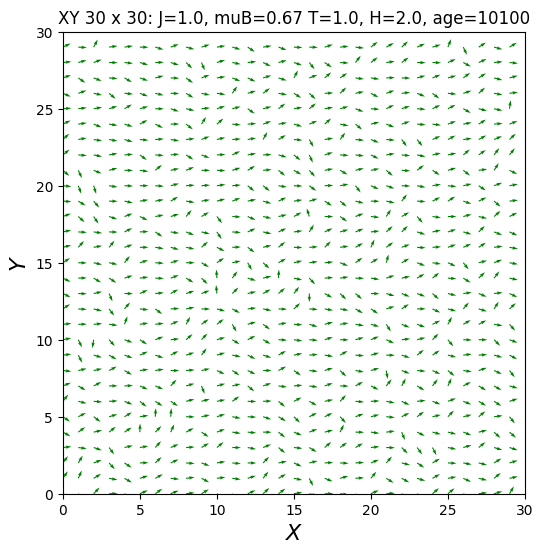

In [5]:
model = XYModel(L = 30, T = 1, H = 2)
model.randomize()
model.evolve(therm = 10000, meas = 100, drop = 1)
model.plot()

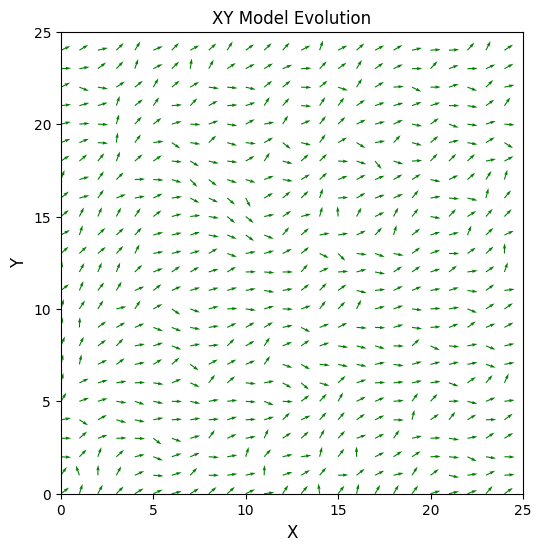

In [6]:
model = XYModel(L = 25, T = 0.5)
model.randomize()
model.animate(100,200)

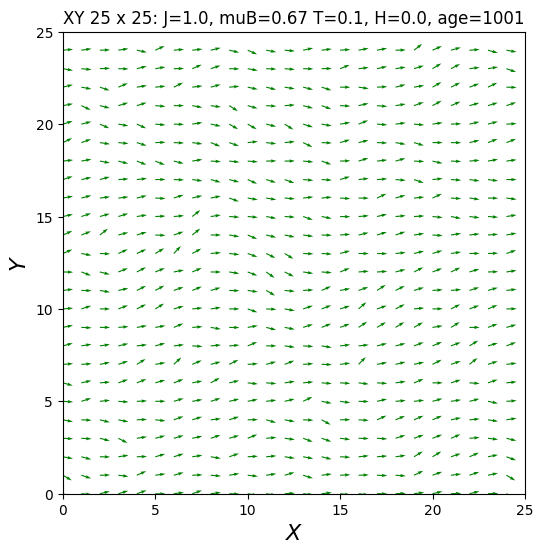

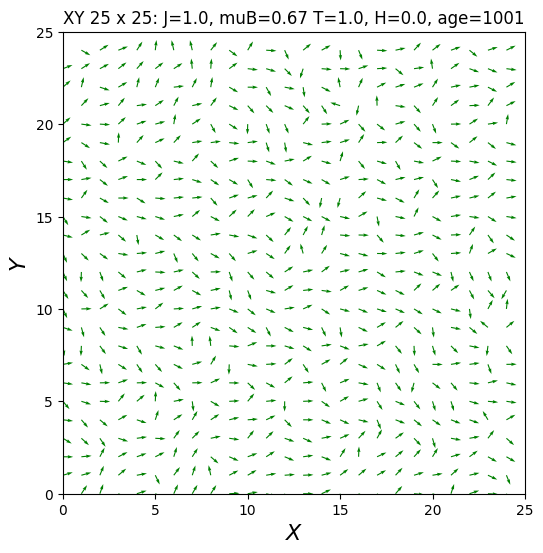

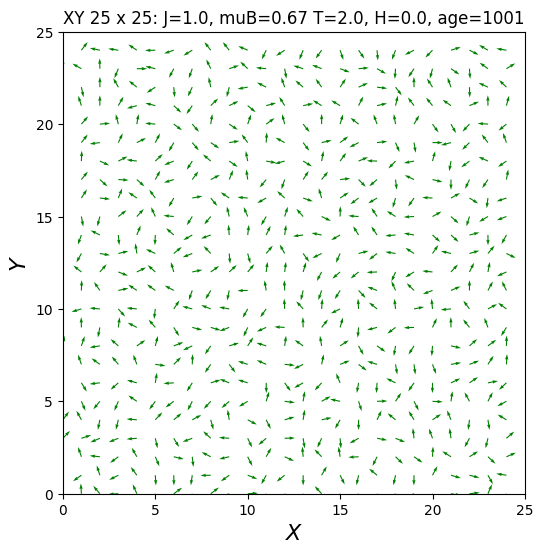

In [7]:
#Assignment 4

temps = [0.1, 1, 2]

for t in temps:
    model = XYModel(L = 25, T = t)
    model.evolve(therm = 1000, meas = 1, drop = 1)
    model.plot()

In [8]:
#Assignment 5 and 6

# Example of a simulation

nRealizations = 100
nTherm    = 2000
nMeasure  = 2000
nDrop     = 5
T = 2
model = XYModel(L = 50, T = t)
specific_heat_Values = numpy.zeros( nRealizations )
magnetization_per_site_Values = numpy.zeros( nRealizations )
magnetic_susceptibility_per_site_Values = numpy.zeros( nRealizations )

for i in range(0, nRealizations):
    print("i =", i)
    model.randomize()
    model.T = T
    result = model.evolve(therm=nTherm, meas=nMeasure, drop=nDrop,)
    specific_heat_Values[i] = result[0]
    magnetization_per_site_Values[i] = result[1]
    magnetic_susceptibility_per_site_Values[i] = result[2]

i = 0
i = 1
i = 2
i = 3
i = 4
i = 5
i = 6
i = 7
i = 8
i = 9
i = 10
i = 11
i = 12
i = 13
i = 14
i = 15
i = 16
i = 17
i = 18
i = 19
i = 20
i = 21
i = 22
i = 23
i = 24
i = 25
i = 26
i = 27
i = 28
i = 29
i = 30
i = 31
i = 32
i = 33
i = 34
i = 35
i = 36
i = 37
i = 38
i = 39
i = 40
i = 41
i = 42
i = 43
i = 44
i = 45
i = 46
i = 47
i = 48
i = 49
i = 50
i = 51
i = 52
i = 53
i = 54
i = 55
i = 56
i = 57
i = 58
i = 59
i = 60
i = 61
i = 62
i = 63
i = 64
i = 65
i = 66
i = 67
i = 68
i = 69
i = 70
i = 71
i = 72
i = 73
i = 74
i = 75
i = 76
i = 77
i = 78
i = 79
i = 80
i = 81
i = 82
i = 83
i = 84
i = 85
i = 86
i = 87
i = 88
i = 89
i = 90
i = 91
i = 92
i = 93
i = 94
i = 95
i = 96
i = 97
i = 98
i = 99


In [9]:
#Assignment 7

# Example of a simulation

nRealizations = 200
nTherm    = 2000
nMeasure  = 2000
nDrop     = 5
T_min = 0.01
T_max = 2
specific_heat_Values = numpy.zeros( nRealizations )
magnetization_per_site_Values = numpy.zeros( nRealizations )
magnetic_susceptibility_per_site_Values = numpy.zeros( nRealizations )
model = XYModel(L = 30)
T_Values = numpy.random.random_sample( nRealizations ) * (T_max - T_min) + T_min

for i in range(0, nRealizations):
    print("i =", i)
    model.randomize()
    model.T = T_Values[i]
    result = model.evolve(therm=nTherm, meas=nMeasure, drop=nDrop,)
    specific_heat_Values[i] = result[0]
    magnetization_per_site_Values[i] = result[1]
    magnetic_susceptibility_per_site_Values[i] = result[2]


i = 0
i = 1
i = 2
i = 3
i = 4
i = 5
i = 6
i = 7
i = 8
i = 9
i = 10
i = 11
i = 12
i = 13
i = 14
i = 15
i = 16
i = 17
i = 18
i = 19
i = 20
i = 21
i = 22
i = 23
i = 24
i = 25
i = 26
i = 27
i = 28
i = 29
i = 30
i = 31
i = 32
i = 33
i = 34
i = 35
i = 36
i = 37
i = 38
i = 39
i = 40
i = 41
i = 42
i = 43
i = 44
i = 45
i = 46
i = 47
i = 48
i = 49
i = 50
i = 51
i = 52
i = 53
i = 54
i = 55
i = 56
i = 57
i = 58
i = 59
i = 60
i = 61
i = 62
i = 63
i = 64
i = 65
i = 66
i = 67
i = 68
i = 69
i = 70
i = 71
i = 72
i = 73
i = 74
i = 75
i = 76
i = 77
i = 78
i = 79
i = 80
i = 81
i = 82
i = 83
i = 84
i = 85
i = 86
i = 87
i = 88
i = 89
i = 90
i = 91
i = 92
i = 93
i = 94
i = 95
i = 96
i = 97
i = 98
i = 99
i = 100
i = 101
i = 102
i = 103
i = 104
i = 105
i = 106
i = 107
i = 108
i = 109
i = 110
i = 111
i = 112
i = 113
i = 114
i = 115
i = 116
i = 117
i = 118
i = 119
i = 120
i = 121
i = 122
i = 123
i = 124
i = 125
i = 126
i = 127
i = 128
i = 129
i = 130
i = 131
i = 132
i = 133
i = 134
i = 135
i = 136
i = 137
i = 13

Text(0.5, 1.0, '$Mag Sus per Site$')

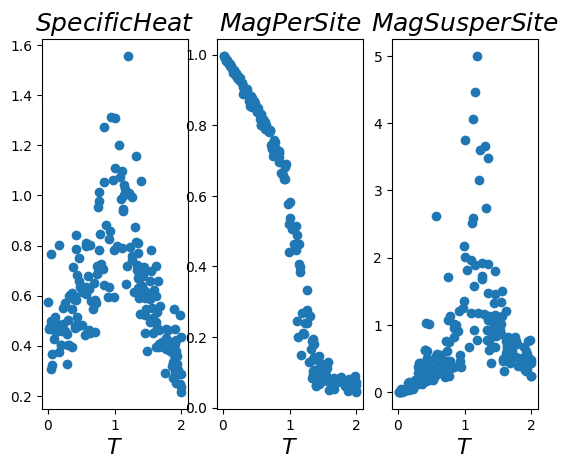

In [10]:
# Let's plot

pyplot.subplot(131)
pyplot.scatter(T_Values, specific_heat_Values)
pyplot.xlabel(r'$T$',fontsize=16)
pyplot.title(r'$Specific Heat$',fontsize=18)

pyplot.subplot(132)
pyplot.scatter(T_Values, magnetization_per_site_Values)
pyplot.xlabel(r'$T$', fontsize = 16)
pyplot.title(r'$Mag Per Site$', fontsize = 18)

pyplot.subplot(133)
pyplot.scatter(T_Values, magnetic_susceptibility_per_site_Values)
pyplot.xlabel(r'$T$',fontsize=16)
pyplot.title(r'$Mag Sus per Site$',fontsize=18)